# Réalisez une ACP - Le jeu de données mystère - Enoncé

# 1 Preliminary

## 1.1 Context

Ce TP est en lien avec l'activité Réalisez une ACP

Nous allons travailler sur le *jeu de données mystère*.

## 1.2 Imports

Nous allons importer nos librairies : 

In [121]:
######

# Il manque du code !

######
import pandas as pd

import numpy as np

import matplotlib.pyplot as plt

from matplotlib.collections import LineCollection

import seaborn as sns

import plotly.express as px

from sklearn.decomposition import PCA

from sklearn.preprocessing import StandardScaler

## 1.3 Graphics and Options

On *charge* `seaborn` : 

In [122]:
sns.set()

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/bootstrap@4.0.0/dist/css/bootstrap.min.css" integrity="sha384-Gn5384xqQ1aoWXA+058RXPxPg6fy4IWvTNh0E263XmFcJlSAwiGgFAW/dAiS6JXm" crossorigin="anonymous">
<script src="https://code.jquery.com/jquery-3.2.1.slim.min.js" integrity="sha384-KJ3o2DKtIkvYIK3UENzmM7KCkRr/rE9/Qpg6aAZGJwFDMVNA/GpGFF93hXpG5KkN" crossorigin="anonymous"></script>
<script src="https://cdn.jsdelivr.net/npm/popper.js@1.12.9/dist/umd/popper.min.js" integrity="sha384-ApNbgh9B+Y1QKtv3Rn7W3mgPxhU9K/ScQsAP7hUibX39j7fakFPskvXusvfa0b4Q" crossorigin="anonymous"></script>
<script src="https://cdn.jsdelivr.net/npm/bootstrap@4.0.0/dist/js/bootstrap.min.js" integrity="sha384-JZR6Spejh4U02d8jOt6vLEHfe/JQGiRRSQQxSfFWpi1MquVdAyjUar5+76PVCmYl" crossorigin="anonymous"></script>

## 1.4 Data

Nous allons maintenant charger les données. 


Importons notre fichier : 

In [123]:
######

# Il manque du code !

######

df = pd.read_csv('mystery_cour_opencl.csv')
df.head()

,0,1,2
0,-7.988979,15.633928,-5.726221
1,0.108386,-3.456144,22.272791
2,1.565447,10.915797,29.040207
3,0.765086,35.831929,20.892023
4,-8.880745,20.989331,8.337199


In [124]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       5000 non-null   float64
 1   1       5000 non-null   float64
 2   2       5000 non-null   float64
dtypes: float64(3)
memory usage: 117.3 KB


In [125]:
# df = df.rename(columns={'0': 'mystery_0', '1': 'mystery_1', '2': 'mystery_2'})

In [126]:
# df

## 1.5 Functions

Nous allons copier - coller les fonctions de notre précédent notebook.

Ces fonctions sont assez complexes. Je ne vous demande pas de les comprendre de A à Z. Essayez juste de les lire à la volée pour voir si vous les comprenez.

Si vous ne comprenez pas tout, encore une fois, cela n'est pas grave.


Pour le graphe des correlations : 

In [127]:
######

# Il manque du code !

#cols = ["inscription","progression","moyenneDeClasse","duree","difficulte","nbChapitres","ratioQuizEvaluation","nbEvaluations"]

######

Pour les plans factoriels : 

In [128]:
######

# Il manque du code !

######

Si vous avez vu des choses bizarres dans le code, pas de soucis, supprimez les lignes en question !

# 2 Data Preparation

Avant de nous jeter dans le grand bain, nous allons devoir étudier et préparer un peu le terrain.

## 2.1 Quick tour

Tout d'abord faisons un rapide tour de nos données. Commencons par les afficher : 

In [129]:
df.head()

,0,1,2
0,-7.988979,15.633928,-5.726221
1,0.108386,-3.456144,22.272791
2,1.565447,10.915797,29.040207
3,0.765086,35.831929,20.892023
4,-8.880745,20.989331,8.337199


In [130]:
df.shape

(5000, 3)

Quelle est la dimension de notre dataframe? 

In [131]:
df.shape

(5000, 3)

La méthode `info` nous donne des indications globales : 

In [132]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       5000 non-null   float64
 1   1       5000 non-null   float64
 2   2       5000 non-null   float64
dtypes: float64(3)
memory usage: 117.3 KB


Quel est le % de valeurs manquantes par colonne ? 

In [133]:
df.isna().mean()

0    0.0
1    0.0
2    0.0
dtype: float64

Y a-t-il des lignes en double ? 

In [134]:
df.duplicated().sum()

190

Combien y a-t-il de valeurs différentes par colonne ? 

In [135]:
df.nunique()

0    4810
1    4810
2    4810
dtype: int64

Enfin la methode `describe` nous donne une idée de la dispertion globale de nos données : 

In [136]:
df.describe()

,0,1,2
count,5000.000000,5000.000000,5000.000000
mean,-1.435869,13.987612,14.640661
std,5.206094,17.666334,9.329521
min,-11.222926,-29.753165,-8.943011
25%,-5.886956,-1.595890,8.535664
50%,-1.351116,16.628227,15.998955
75%,3.143237,27.312951,21.854507
max,8.485872,44.376445,30.373069


Le dataframe est assez simple, pas de nettoyage à faire. Tant mieux!

## Data Split

Nous allons ensuite séparer nos données. D'un coté X la matrice des données :

In [137]:
X = df.values
X[:5]

array([[-7.98897945, 15.63392829, -5.72622111],
       [ 0.10838595, -3.45614357, 22.2727908 ],
       [ 1.56544678, 10.91579724, 29.04020702],
       [ 0.76508597, 35.83192865, 20.89202291],
       [-8.88074509, 20.98933144,  8.33719879]])

C'est bien un 'np.array' :

In [138]:
type(X)

numpy.ndarray

La forme de cette matrice est conforme à nos attentes :

In [139]:
X.shape

(5000, 3)

Optionnel  Nous enregistrons les noms de nos cours dans une variable names :

In [140]:
names = df.index
names

RangeIndex(start=0, stop=5000, step=1)

et nos colonnes, nos features, dans une variable features :

In [141]:
features = df.columns
features

Index(['0', '1', '2'], dtype='object')

# 3 About PCA

## 3.1 Scaling

Nous allons effectuer notre scaling. Attention toutefois, réduire n'est ici pas nécessaire car les variables sont exprimées dans la même unité. 

On se contente juste de centrer les données, ce qui est obligatoire pour une ACP.

Pour ce faire, on peut utiliser l'argument `with_std=False` : 

In [142]:
scaler = StandardScaler(with_std=False)
scaler

StandardScaler(with_std=False)

On fit : 

In [143]:
scaler.fit(X)

StandardScaler(with_std=False)

On transforme : 

In [144]:
X_scaled = scaler.transform(X)
X_scaled[:5]

array([[ -6.55311011,   1.64631658, -20.36688189],
       [  1.54425529, -17.44375528,   7.63213002],
       [  3.00131612,  -3.07181447,  14.39954624],
       [  2.20095531,  21.84431694,   6.25136213],
       [ -7.44487575,   7.00171974,  -6.30346199]])

## 3.2 PCA

Nous allons travailler sur les 3 composantes : 

In [145]:
n_components = 3

On instancie notre ACP : 

In [146]:
pca = PCA(n_components=n_components)

On l'entraine : 

In [147]:
pca.fit(X_scaled)

PCA(n_components=3)

## 3.3 Explained variance & scree plot

Intéressons nous maintenant à la variance *captée* par chaque nouvelle composante. Grace à `scikit-learn` on peut utiliser l'attribut `explained_variance_ratio_` : 

In [148]:
pca.explained_variance_ratio_

array([0.74965329, 0.20442347, 0.04592324])

Ici la 1ère composante *capte* 75% de la variance de nos données initiales, la 2ème 20% etc etc.

Enregistrons cela dans une variable : 

In [149]:
scree = (pca.explained_variance_ratio_*100).round(2)
scree

array([74.97, 20.44,  4.59])

Les 2 premières composantes *captent* - à elles seules -  `75+20 = 95%` de la variance!!!

Dans le jargon, cela s'appelle une *somme cumulée*. Et pour faire une somme cumulée `numpy`dispose de la fonction `cumsum` : 

In [150]:
scree_cum = scree.cumsum().round()
scree_cum

array([ 75.,  95., 100.])

Définisions ensuite une variable avec la liste de nos composantes : 

In [151]:
x_list = range(1, n_components+1)
list(x_list)

[1, 2, 3]

On peut enfin l'afficher de façon graphique : 

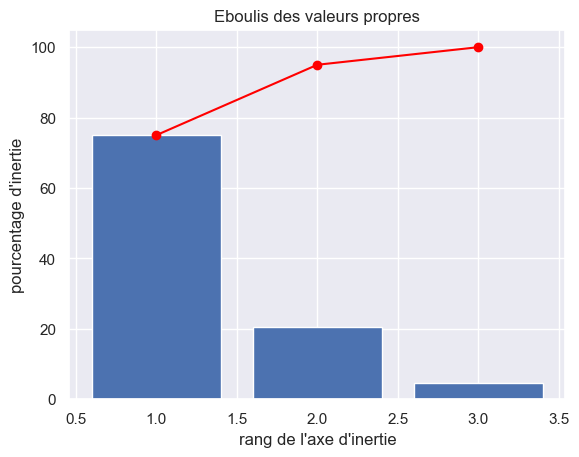

In [152]:
plt.bar(x_list, scree)
plt.plot(x_list, scree_cum,c="red",marker='o')
plt.xlabel("rang de l'axe d'inertie")
plt.ylabel("pourcentage d'inertie")
plt.title("Eboulis des valeurs propres")
plt.show(block=False)

On a en bleu la variance de chaque nouvelle composante, et en rouge la variance cumulée.

On voit ici que près de 95% de la variance est comprise dans les 2 premières composantes. En clair, la 3e composante n'est pas très *utile*...

## 3.4 Components

Intéressons nous maintenant à nos fameuses composantes. Nous avons dit dans le cours que c'est bien par un calcul que l'on obtient ces composantes. 

La formule de ce calcul nous est donnée par l'attribut `components_`. Cette variable est généralement nommée `pcs` : 

In [153]:
pcs = pca.components_
pcs

array([[ 0.15580956, -0.98750579, -0.02357312],
       [-0.06045988,  0.01428585, -0.99806839],
       [-0.98593508, -0.15693382,  0.05747861]])

Affichons la même chose mais version `pandas` : 

In [154]:
pcs = pd.DataFrame(pcs)
pcs

,0,1,2
0,0.155810,-0.987506,-0.023573
1,-0.060460,0.014286,-0.998068
2,-0.985935,-0.156934,0.057479


Intéressant... Mais pas encore très clair...
Continuons le travail : 

In [155]:
pcs.columns = df.columns
pcs.index = [f"F{i}" for i in x_list]
pcs.round(2)

,0,1,2
F1,0.16,-0.99,-0.02
F2,-0.06,0.01,-1.00
F3,-0.99,-0.16,0.06


De mieux en mieux !  

-- **ATTENTION** -- : Nous avons arrondi les résultats pour simplifier l'analyse :) 



Alors, comment calcule t-on la première composante `F1` ? 

et bien c'est assez simple :

`F1 = (0.16 * x) + (-0.99 * y) + (0.02 * z)`

et F2 ?

`F2 = (-0.06 * x) + (-0.01 * y) + (-1.0 * z)`

**Eureka !**



Dans certains cas, on voudra afficher ce dataframe comme cela : 

In [156]:
pcs.T

,F1,F2,F3
0,0.155810,-0.060460,-0.985935
1,-0.987506,0.014286,-0.156934
2,-0.023573,-0.998068,0.057479


Et pour une représentation plus *visuelle*, comme cela : 

<AxesSubplot:>

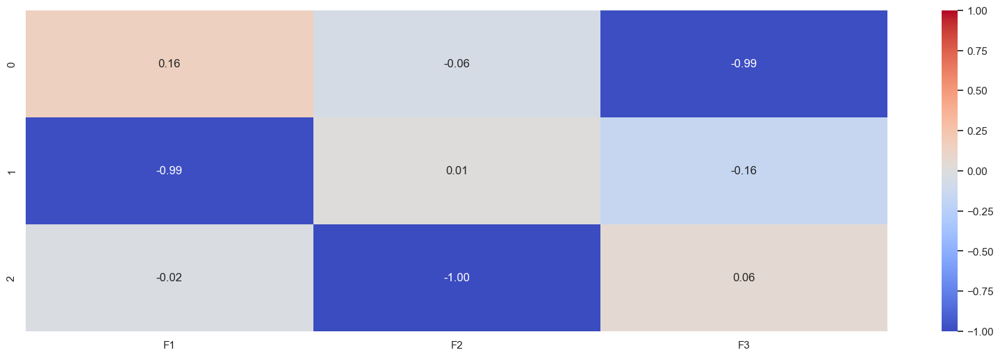

In [157]:
fig, ax = plt.subplots(figsize=(20, 6))
sns.heatmap(pcs.T, vmin=-1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")

A ce stade, on sait déja que :  
* `F1+F2 =95%` de la variance.
* `F1 = -y + 'un peu' de x` et `F2 = z`

## 3.5 Correlation graph

Pour la partie graphique, nous allons utiliser les fonctions vues dans la section 1.5.



Le code fourni trace le cercle de corrélation pour les deux premières composantes principales (PC1 et PC2) d'une analyse en composantes principales (ACP). Le cercle de corrélation est un graphique qui montre les corrélations entre les variables et les composantes principales.

Les flèches dans le cercle de corrélation représentent les variables et leur relation avec les composantes principales. Plus la flèche est longue, plus la variable a une forte corrélation avec la composante principale correspondante.

Les lignes horizontales et verticales tracées représentent les axes des composantes principales. Elles indiquent la proportion de variance expliquée par chaque composante principale.

Les noms des variables sont également ajoutés aux graphiques, ce qui permet de voir quelles variables sont les plus corrélées avec les composantes principales.

En résumé, le code fourni permet de visualiser les corrélations entre les variables et les composantes principales d'une ACP, ce qui peut aider à comprendre comment les variables contribuent à la variance des données.

Le cercle de corrélation pour les deux premières composantes principales (PC1 et PC2) d'une analyse en composantes principales (ACP) montre les corrélations entre les variables et les composantes principales. Le graphique présente un cercle qui représente les variables et deux axes qui représentent les composantes principales. Les flèches partant de l'origine du cercle et pointant vers les variables indiquent la direction et la force de la corrélation entre chaque variable et les composantes principales.

Dans ce graphique, on peut voir que la variable X1 est fortement corrélée avec la première composante principale (PC1), tandis que la variable X2 est plus corrélée avec la deuxième composante principale (PC2). Les variables X3, X4 et X5 ont une corrélation plus faible avec les composantes principales, car leurs flèches sont plus courtes et plus proches du centre du cercle.

Cette visualisation est utile pour identifier les variables qui ont une influence importante sur les composantes principales, et peut aider à comprendre les relations entre les variables dans les données analysées.

Définissons nos axes x et y. Nous allons utiliser les 2 premières composantes. Comme - en code - on commence à compter à partir de 0, cela nous donne : 

In [158]:
x, y = 0,1

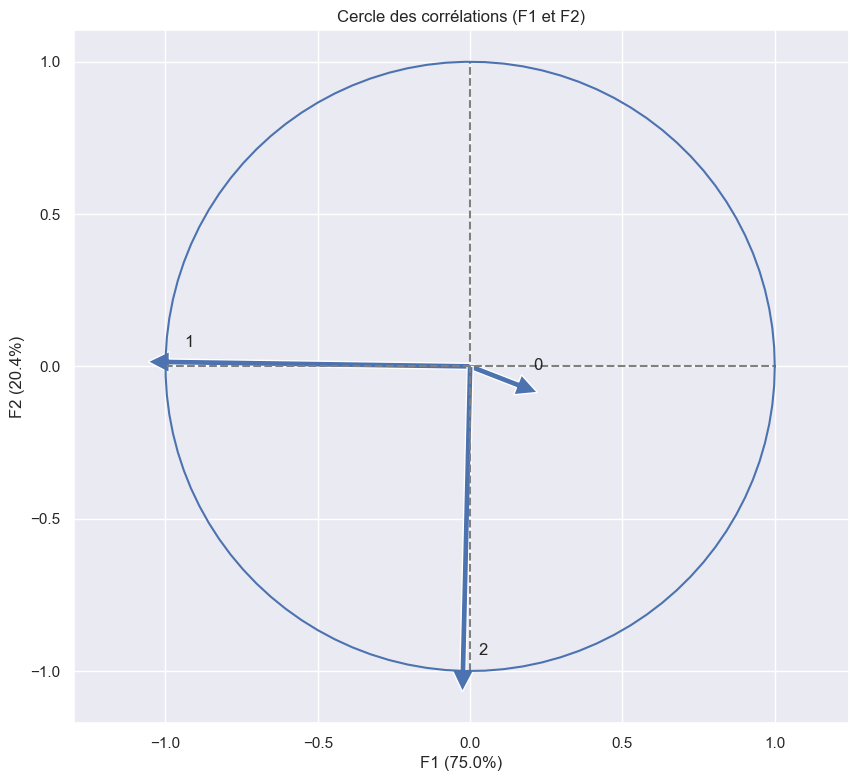

In [159]:
fig, ax = plt.subplots(figsize=(10, 9))
for i in range(0, pca.components_.shape[1]):
    ax.arrow(0,
             0,  # Start the arrow at the origin
             pca.components_[0, i],  #0 for PC1
             pca.components_[1, i],  #1 for PC2
             head_width=0.07,
             head_length=0.07, 
             width=0.02,              )

    plt.text(pca.components_[0, i] + 0.05,
             pca.components_[1, i] + 0.05,
             features[i])
    
# affichage des lignes horizontales et verticales
plt.plot([-1, 1], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-1, 1], color='grey', ls='--')


# nom des axes, avec le pourcentage d'inertie expliqué
plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))


an = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale
plt.axis('equal')
plt.show(block=False)

Conclusion : F1 est principalement composée de -y et F2 de -z.

On peut en faire une fonction :

In [160]:
def correlation_graph(pca, 
                      x_y, 
                      features) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 9))

    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i])
        
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    # J'ai copié collé le code sans le lire
    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

Essayons cette fonction pour F1 et F2

ATTENTION Encore une fois Pour F1 et F2 il faut bien préciser 0 et 1 

In [161]:
x_y = (0,1)
x_y

(0, 1)

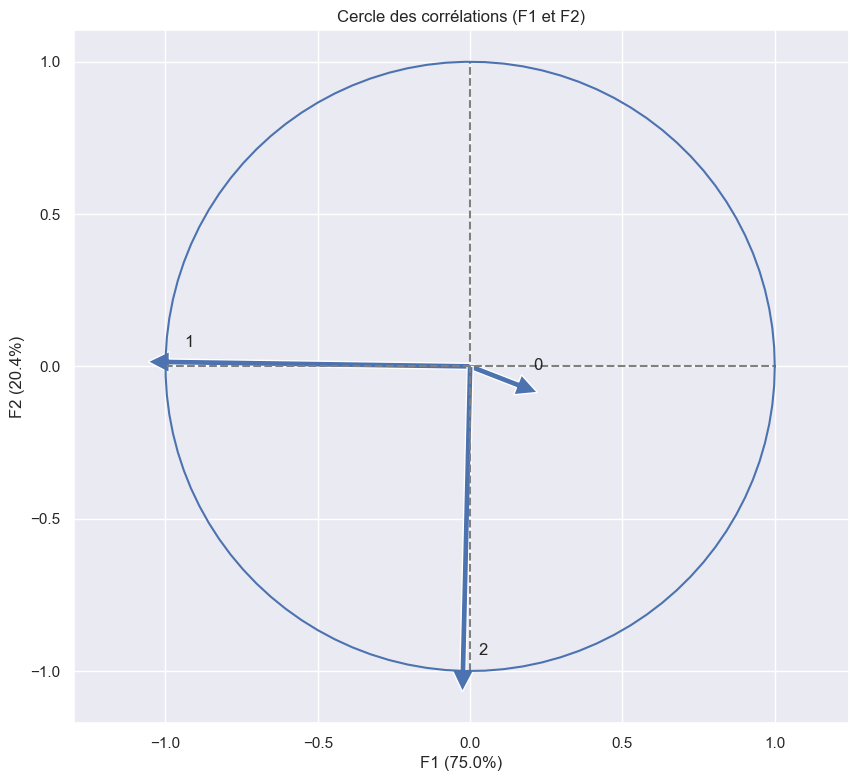

In [162]:
correlation_graph(pca, x_y, features)

Conclusion : F1 est principalement composée de -y et F2 de -z.

## 3.6 Projection

Travaillons maintenant sur la projection de nos dimensions. Tout d'abord calculons les coordonnées de nos individus dans le nouvel espace : 

In [163]:
X_proj = pca.transform(X_scaled)
X_proj[:5]

array([[ -2.16667348,  20.74726035,   5.03191836],
       [ 17.28650602,  -7.95995203,   1.65366397],
       [  3.16162615, -14.59707465,  -1.64936538],
       [-21.37582371,  -6.06029191,  -5.23879165],
       [ -7.92562936,   6.84142795,   5.8790433 ]])

On rappelle que : 

In [164]:
x, y

(0, 1)

In [165]:
x_y = x, y
x_y

(0, 1)

Accrochez vous, car voici la fonction.

Pour info, sachez que nous reviendrons dessus lors du TP de la 3e partie. Pas besoin de trop rentrer dans le détail pour l'instant, mais lisez la quand même le code, au moins une fois, en diagonale...

In [166]:
def display_factorial_planes(   X_projected, 
                                x_y, 
                                pca=None, 
                                labels = None,
                                clusters=None, 
                                alpha=1,
                                figsize=[10,8], 
                                marker="." ):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize: 
        figsize = (7,6)

    # On gère les labels
    if  labels is None : 
        labels = []
    try : 
        len(labels)
    except Exception as e : 
        raise e

    # On vérifie la variable axis 
    if not len(x_y) ==2 : 
        raise AttributeError("2 axes sont demandées")   
    if max(x_y )>= X_.shape[1] : 
        raise AttributeError("la variable axis n'est pas bonne")   

    # on définit x et y 
    x, y = x_y

    # Initialisation de la figure       
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters
 
    # Les points    
    # plt.scatter(   X_[:, x], X_[:, y], alpha=alpha, 
    #                     c=c, cmap="Set1", marker=marker)
    sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c)

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe 
    if pca : 
        v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
        v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
    else : 
        v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'F{x+1} {v1}')
    ax.set_ylabel(f'F{y+1} {v2}')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() *1.1
    y_max = np.abs(X_[:, y]).max() *1.1

    # On borne x et y 
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels) : 
        # j'ai copié collé la fonction sans la lire
        for i,(_x,_y) in enumerate(X_[:,[x,y]]):
            plt.text(_x, _y+0.05, labels[i], fontsize='14', ha='center',va='center') 

    # Titre et display
    plt.title(f"Projection des individus (sur F{x+1} et F{y+1})")
    plt.show()


Essayons avec F1 et F2 : 

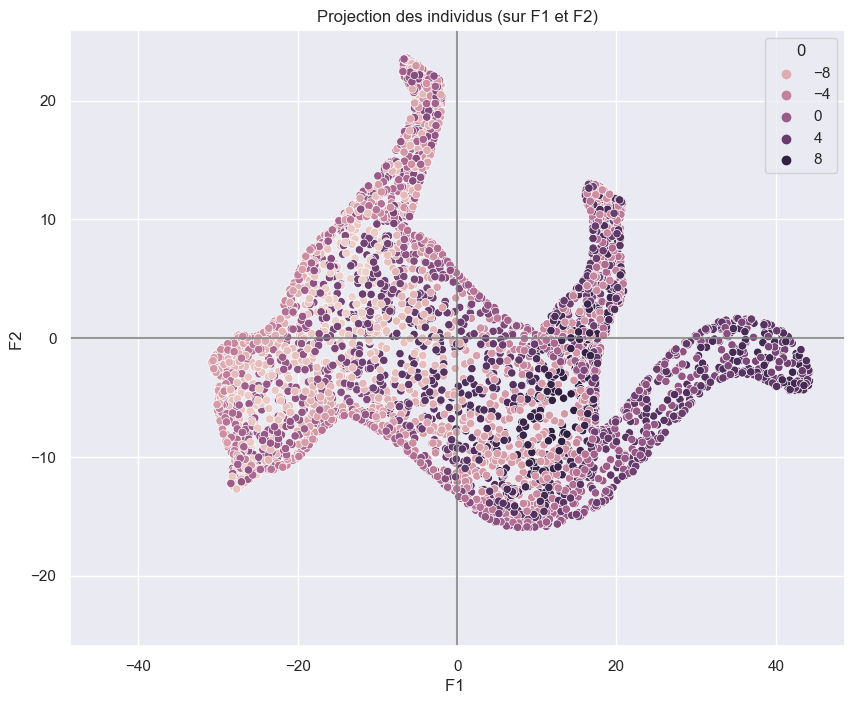

In [167]:
x_y = [0,1]
display_factorial_planes(X_proj, x_y, clusters=df['0'])

Ohhhh ... Un chat ! 

Intéressant, mais il manque quelques éléments...

Essayons la version plus élaborée avec F1 et F2 :

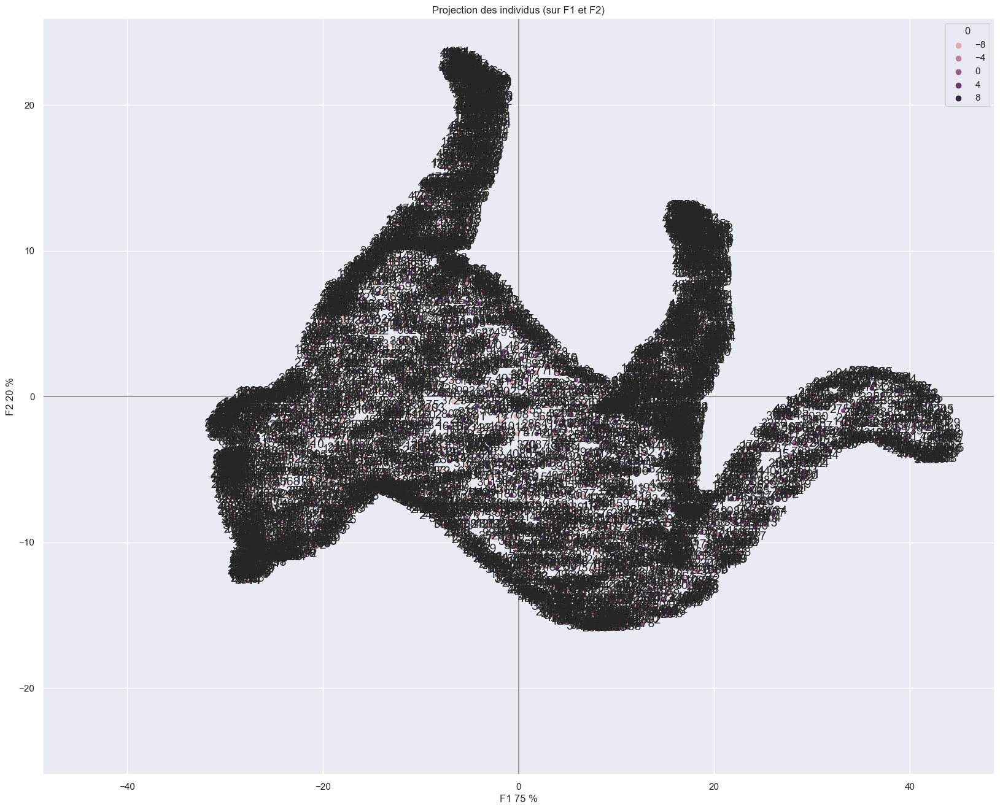

In [168]:
x_y = [0,1]

display_factorial_planes(X_proj, x_y, pca, labels=names, figsize=(20,16), clusters=df['0'], marker="o")

Essayons avec F1 et F3 : 

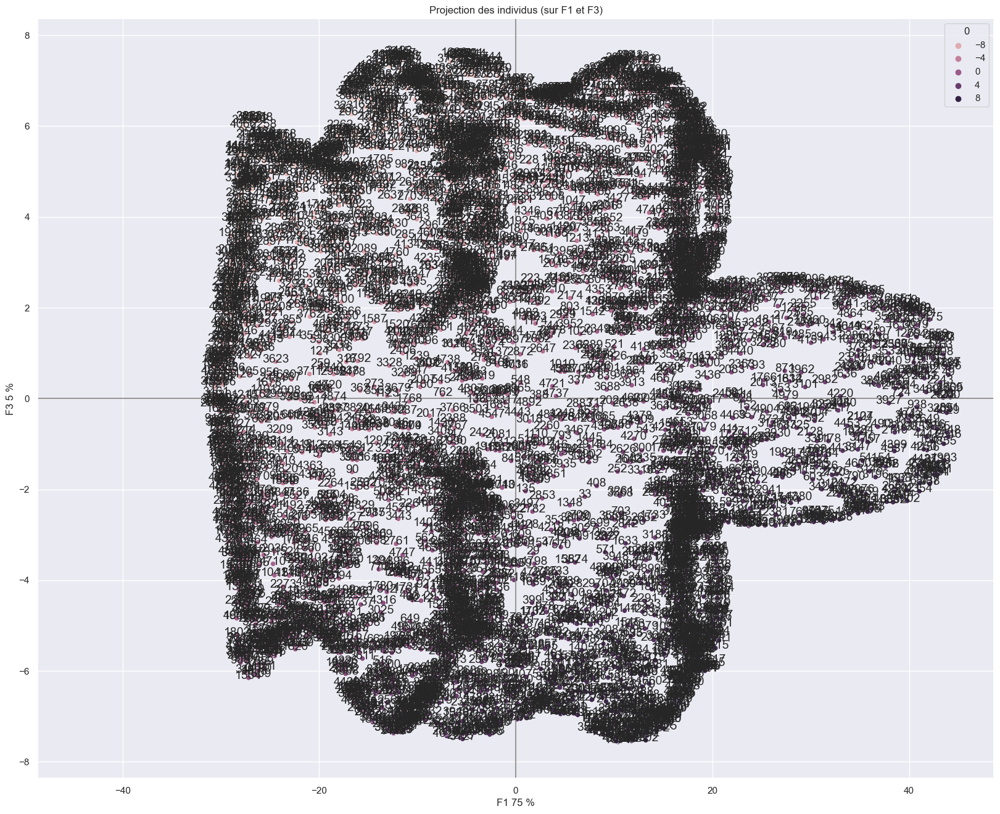

In [169]:
x_y = [0,2]

display_factorial_planes(X_proj, x_y, pca, labels=names, figsize=(20,16), clusters=df['0'],marker="o")

Un chat vue de dessous ? 

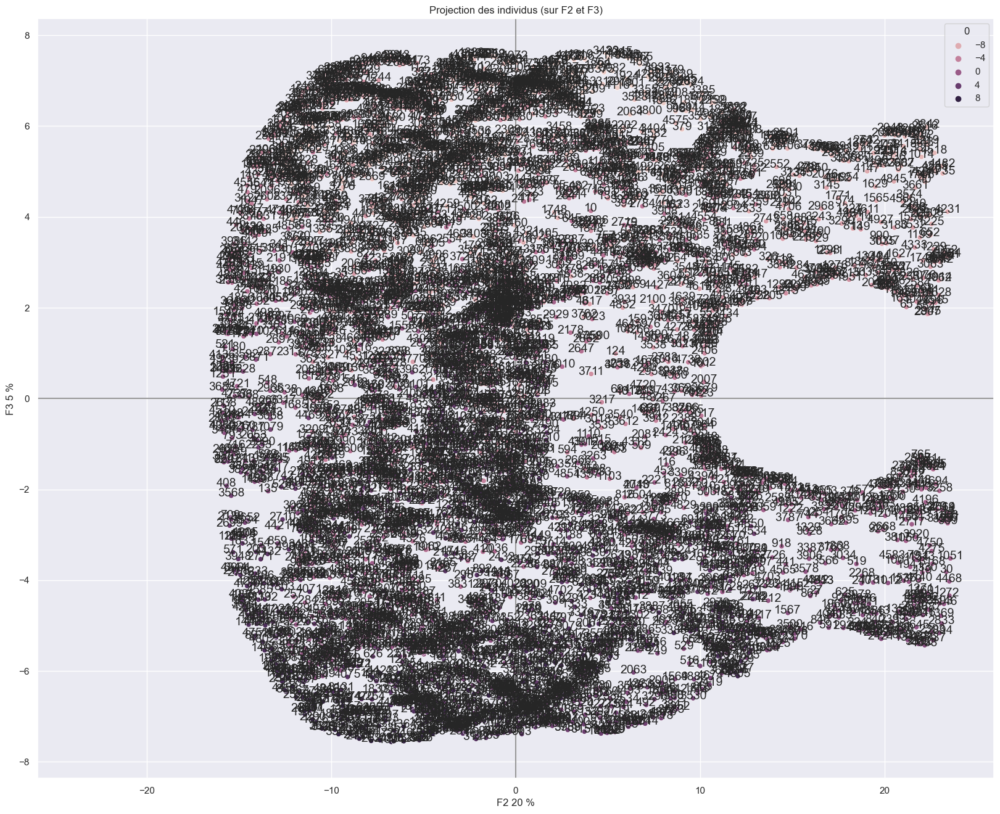

In [170]:
x_y = [1,2]

display_factorial_planes(X_proj, x_y, pca, labels=names, figsize=(20,16), clusters=df['0'],marker="o")

Un chat vue de derrière ? 

## 3.7 Bonus

Je vous laisse avec un petit bonus. Nous allons utiliser la librairie `plotly` pour faire un affichage en 3 dimensions : 

In [172]:
fig = px.scatter_3d(df, x='0', y='1', z='2', opacity=0.3)
fig.show()

Passez votre souris sur l'image, vous pourrez zoomer, dézoomer, décaller les axes etc etc.

Magique non ? 


Pour en savoir plus, c'est par [ici](https://plotly.com/python/).